In [1]:
# Import required libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
from datetime import datetime
from wordcloud import WordCloud


In [4]:

# Load the dataset
df = pd.read_excel('FlipSouk_cleaned_dataset_final.xlsx')
df.dtypes
# Replace NaN values with meaningful labels
df['type'] = df['type'].fillna('Unspecified Type')
df['style'] = df['style'].fillna('Unspecified Style')

# Convert 'brand' column to string type before creating the treemap
df['brand'] = df['brand'].astype(str)
# Convert 'time' column to datetime objects if it's not already
# Check if the 'time' column is not already in datetime format
if not pd.api.types.is_datetime64_any_dtype(df['time']):
    df['time'] = pd.to_datetime(df['time'])
# Ensure 'date' column is in datetime format
if not pd.api.types.is_datetime64_any_dtype(df['date']):
    df['date'] = pd.to_datetime(df['date'])

df.isnull().sum()


<ipython-input-4-342be4eb93d3>:13: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['time'] = pd.to_datetime(df['time'])


,0
uniq_id,0
product_url,0
product_name,0
retail_price,0
discounted_price,0
image,0
is_FK_Advantage_product,0
description,0
product_rating,0
brand,0


<ipython-input-8-a26c5140f471>:16: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


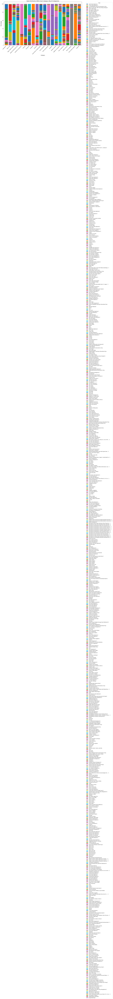

In [8]:
# Limit the dataset to the top 20 categories to make the chart manageable
top_categories = df['category'].value_counts().nlargest(20).index
filtered_df = df[df['category'].isin(top_categories)]

# Compute percentage distribution within each category
style_cat = pd.crosstab(filtered_df['category'], filtered_df['style'], normalize='index') * 100

# Plot
plt.figure(figsize=(18, 10))
style_cat.plot(kind='bar', stacked=True, width=0.8, ax=plt.gca())
plt.title('Style Distribution Within Each Category (Top 20 Categories)', fontsize=14)
plt.xlabel('Category', fontsize=12)
plt.ylabel('Percentage', fontsize=12)
plt.legend(title='Style', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

<ipython-input-9-8cba2e8b123f>:17: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout(pad=2)


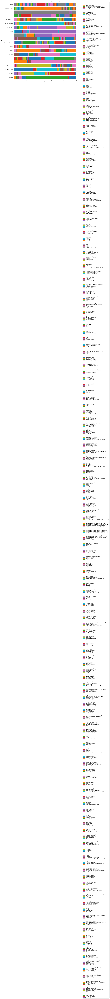

In [9]:
# Limit the dataset to the top 20 categories to make the chart manageable
top_categories = df['category'].value_counts().nlargest(20).index
filtered_df = df[df['category'].isin(top_categories)]

# Compute percentage distribution within each category
style_cat = pd.crosstab(filtered_df['category'], filtered_df['style'], normalize='index') * 100

# Plot with horizontal bars to avoid x-axis overcrowding
fig, ax = plt.subplots(figsize=(15, 18))
style_cat.plot(kind='barh', stacked=True, ax=ax, width=0.8)
plt.title('Style Distribution Within Each Category (Top 20 Categories)', fontsize=14)
plt.xlabel('Percentage', fontsize=12)
plt.ylabel('Category', fontsize=12)
plt.legend(title='Style', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout with padding
plt.tight_layout(pad=2)
plt.show()

In [11]:
# Limit the dataset to the top 20 categories to make the chart manageable
top_categories = df['category'].value_counts().nlargest(20).index
filtered_df = df[df['category'].isin(top_categories)]

# Compute percentage distribution within each category
style_cat = pd.crosstab(filtered_df['category'], filtered_df['style'], normalize='index') * 100
style_cat = style_cat.reset_index().melt(id_vars='category', var_name='style', value_name='percentage')

# Create the interactive stacked bar chart
fig = px.bar(style_cat, x='percentage', y='category', color='style', orientation='h',
             title="Style Distribution Within Each Category (Top 20 Categories)",
             labels={'percentage': 'Percentage', 'category': 'Category', 'style': 'Style'})

fig.update_layout(barmode='stack', legend=dict(title="Style"), xaxis=dict(tickformat=".0f"))
fig.show()

<ipython-input-5-5640bbd80ab6>:10: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


<Figure size 1500x800 with 0 Axes>

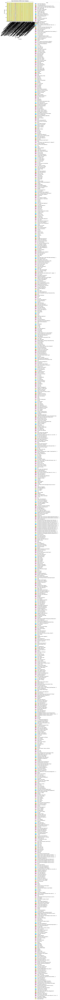

In [5]:
# 25. Style Distribution Within Categories - Stacked Percentage Bar Chart
plt.figure(figsize=(15, 8))
style_cat = pd.crosstab(df['category'], df['style'], normalize='index') * 100
style_cat.plot(kind='bar', stacked=True)
plt.title('Style Distribution Within Each Category', fontsize=12)
plt.xlabel('Category')
plt.ylabel('Percentage')
plt.legend(title='Style', bbox_to_anchor=(1.05, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()